In [1]:
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
from skimage import feature
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report,  precision_score, recall_score, f1_score
from joblib import dump
from joblib import load
from imblearn.over_sampling import SMOTE

In [2]:
Paederus = 'paederus'
Other_ant = 'Other_ant'

In [62]:
def load_resize_and_compute_hog(folder, label):
    images = []
    hog_features = []
    labels = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            img = cv2.resize(img, (128,256))
            images.append(img)
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            features, hog_image = hog(gray_img, 
                              pixels_per_cell=(8, 8), 
                              cells_per_block=(2, 2), 
                              orientations=9, 
                              visualize=True, 
                              block_norm='L2-Hys',    
                              transform_sqrt=True,
                              channel_axis=None)
            
            
            hog_features.append(features)   # Lưu đặc trưng HOG
            labels.append(label)
    return images, np.array(hog_features), labels

In [60]:
def show_image_and_hog(image):
    img = cv2.resize(image, (128, 256))
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Tính HOG và lấy hình ảnh HOG
    _, hog_image = hog(gray_img, 
                       pixels_per_cell=(8, 8), 
                       cells_per_block=(2, 2), 
                       orientations=9, 
                       visualize=True, 
                       block_norm='L2-Hys',    
                       transform_sqrt=True,
                       channel_axis=None)
    
    # Rescale hình ảnh HOG để dễ quan sát
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 255))
        
    # Hiển thị hình ảnh và HOG
    plt.figure(figsize=(15, 5))
    
    # Hình ảnh gốc
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')
    
    # Hình ảnh HOG
    plt.subplot(1, 3, 2)
    plt.imshow(hog_image_rescaled, cmap='gray')
    plt.title("HOG Features")
    plt.axis('off')
    
   
    plt.show()


In [63]:
# Tải và xử lý ảnh Paederus
Paederus_images, Paederus_hog_features, Paederus_labels = load_resize_and_compute_hog(Paederus, label=1)

# Tải và xử lý ảnh Other Ant
Other_ant_images, Other_ant_hog_features, Other_ant_labels = load_resize_and_compute_hog(Other_ant, label=0)

In [64]:
# Kết hợp các đặc trưng và nhãn
all_hog_features = np.vstack((Paederus_hog_features, Other_ant_hog_features))
all_labels = np.array(Paederus_labels + Other_ant_labels)

In [65]:
X_train, X_test, y_train, y_test = train_test_split(all_hog_features, all_labels, test_size=0.3, random_state=42)

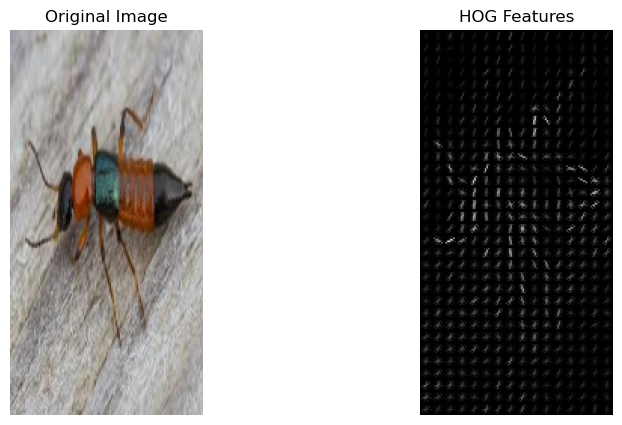

In [61]:
show_image_and_hog(Paederus_images[28])

In [66]:
svm_classifier = SVC(kernel='linear', C=1.0, class_weight='balanced')
svm_classifier.fit(X_train, y_train)

SVC(class_weight='balanced', kernel='linear')

In [67]:
# Dự đoán và đánh giá
y_pred = svm_classifier.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.89      0.82        45
           1       0.62      0.40      0.48        20

    accuracy                           0.74        65
   macro avg       0.69      0.64      0.65        65
weighted avg       0.72      0.74      0.72        65



In [68]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.74


In [69]:
print("Accuracy: "+str(accuracy_score(y_test, y_pred)))
print("Precision: "+str(precision_score(y_test, y_pred)))
print("Recall: "+str(recall_score(y_test, y_pred)))
print("F1-score: "+str(f1_score(y_test, y_pred)))

Accuracy: 0.7384615384615385
Precision: 0.6153846153846154
Recall: 0.4
F1-score: 0.48484848484848486


In [70]:
dump(svm_classifier, "svm_model_hog.joblib")


['svm_model_hog.joblib']

In [71]:
loaded_model = load("svm_model_hog.joblib")

In [72]:
def load_resize_and_compute_hog_image(image_list):
    hog_features = []
    for image in image_list:
        # Resize ảnh về kích thước 128x256
        resized_img = cv2.resize(image, (128, 256))
        
        # Chuyển ảnh sang grayscale
        gray_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)
        
        # Trích xuất đặc trưng HOG
        features, _ = hog(gray_img, 
                          pixels_per_cell=(8, 8), 
                          cells_per_block=(2, 2), 
                          orientations=9, 
                          visualize=True, 
                          channel_axis=None)  
        
        hog_features.append(features)  # Lưu đặc trưng HOG vào danh sách
        
    return hog_features

In [74]:

def show_image_with_prediction_model_hog(image_path, model):
    """
    Hiển thị ảnh cùng với kết quả dự đoán.

    Parameters:
    - image_path: Đường dẫn đến ảnh cần dự đoán.
    - model: Mô hình SVM đã huấn luyện (được tải từ joblib).
    - bins: Số lượng bin để tính histogram (mặc định là (8, 8, 8)).
    """
    # Đọc ảnh và resize
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Không thể đọc ảnh từ đường dẫn đã cung cấp.")
    resized_img = cv2.resize(img, (128, 256))

    image_feature=load_resize_and_compute_hog_image([resized_img])

    #Dự đoán với mô hình
    prediction = model.predict(image_feature)
    label = "Paederus" if prediction[0] == 1 else "Other Ant"

    # Hiển thị ảnh và kết quả dự đoán
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Chuyển ảnh từ BGR sang RGB để hiển thị
    plt.title(f"Prediction: {label}", fontsize=16)
    plt.axis("off")
    plt.show()

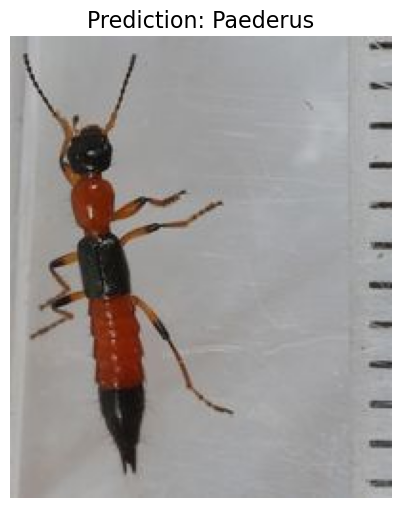

In [75]:
image_path = "paederus1.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

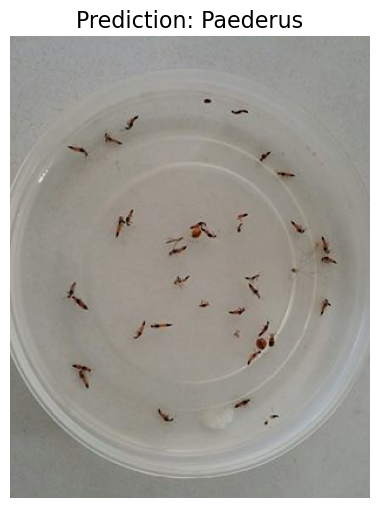

In [28]:
image_path = "paederus7.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

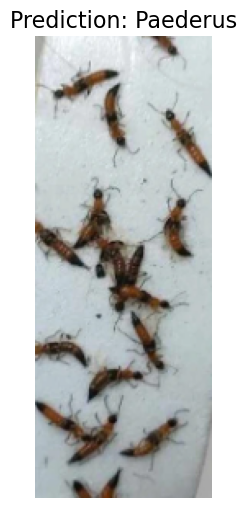

In [29]:
image_path = "paederus8.png"
show_image_with_prediction_model_hog(image_path,loaded_model)

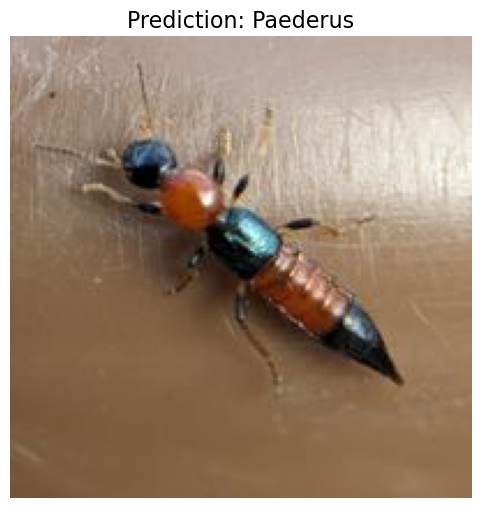

In [296]:
image_path = "paederus2.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

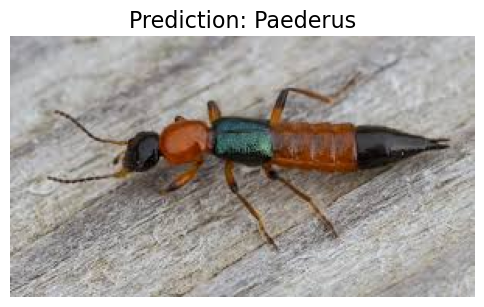

In [297]:
image_path = "paederus3.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

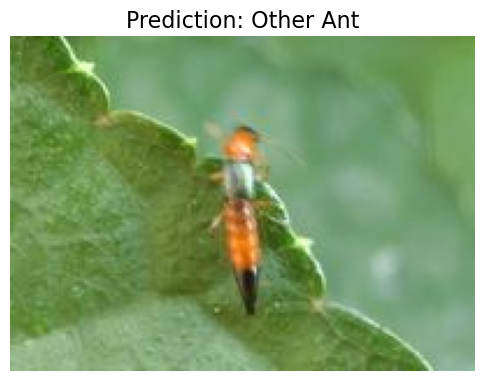

In [30]:
image_path = "paederus4.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

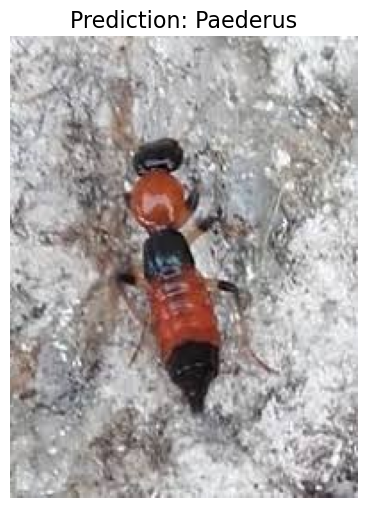

In [299]:
image_path = "paederus5.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

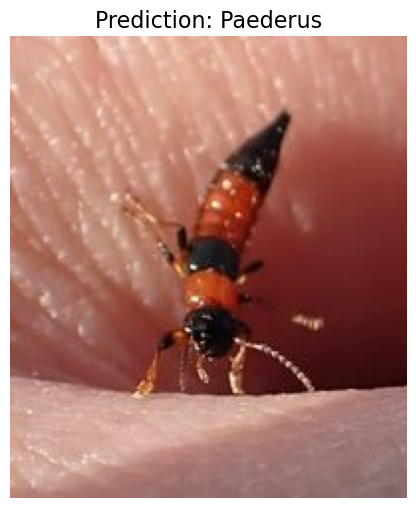

In [300]:
image_path = "paederus6.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

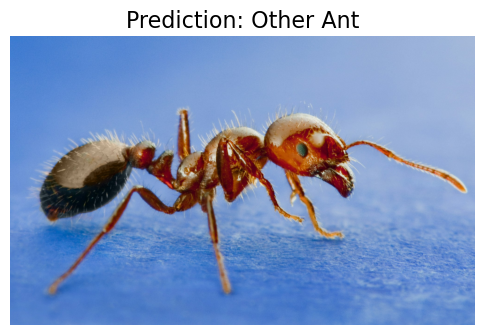

In [289]:
image_path = "other_ant1.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

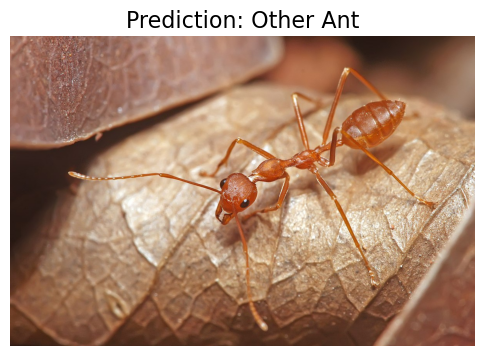

In [20]:
image_path = "other_ant8.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

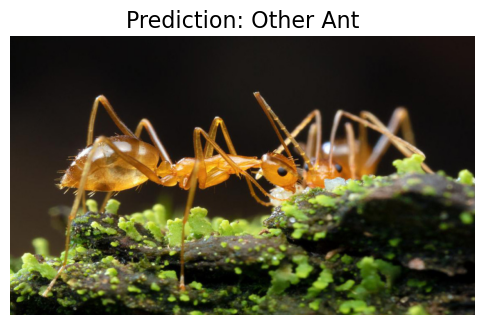

In [21]:
image_path = "other_ant9.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

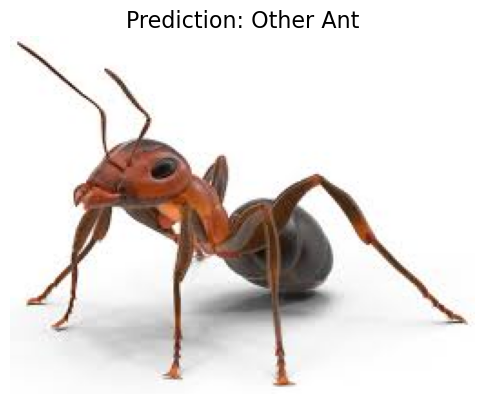

In [291]:
image_path = "other_ant2.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

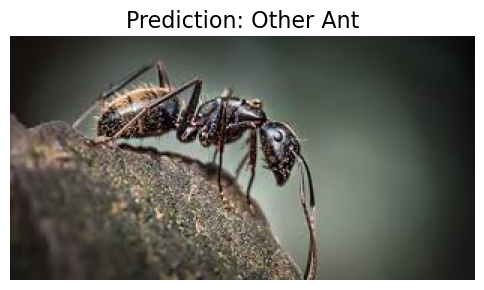

In [292]:
image_path = "other_ant3.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

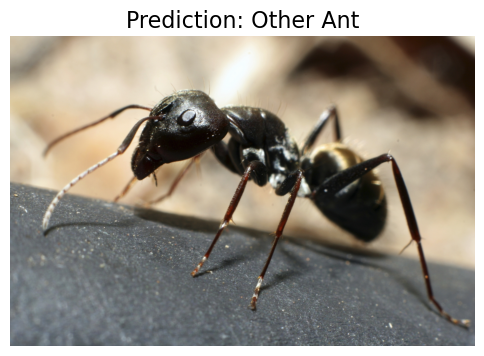

In [293]:
image_path = "other_ant4.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

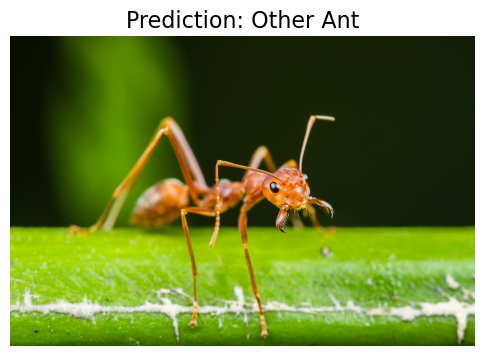

In [294]:
image_path = "other_ant5.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

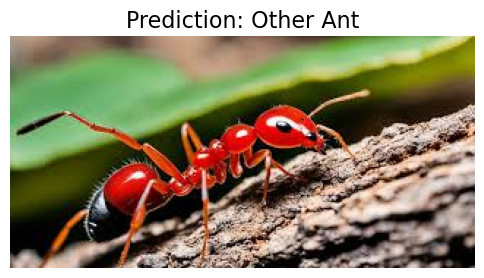

In [295]:
image_path = "other_ant6.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

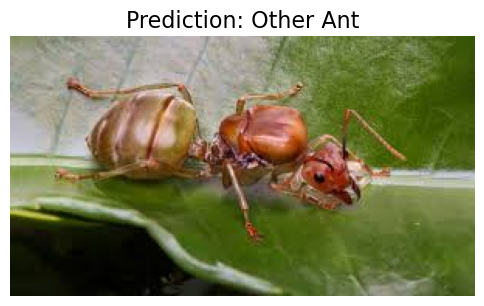

In [31]:
image_path = "other_ant7.jpg"
show_image_with_prediction_model_hog(image_path,loaded_model)

In [76]:
def load_and_resize_images_from_folder_histogram(folder, label):
    images = []
    labels = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            img = cv2.resize(img, (224,224))
            images.append(img)
            labels.append(label)
    return images, labels

In [77]:
Paederus_images, Paederus_labels = load_and_resize_images_from_folder_histogram(Paederus, label=1)
Other_ant_images, Other_ant_labels = load_and_resize_images_from_folder_histogram(Other_ant, label=0)

In [303]:
print("Paederus_labels:", Paederus_labels)
print("Other_ant_labels:", Other_ant_labels)

Paederus_labels: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Other_ant_labels: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [78]:
import random
random_indices = random.sample(range(len(Paederus_images)), 10)

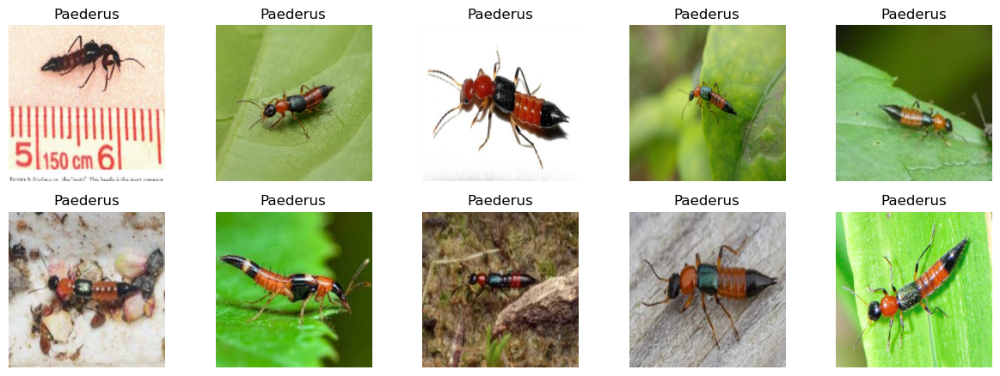

In [79]:
# Hiển thị ảnh
plt.figure(figsize=(15, 8))
for i, idx in enumerate(random_indices, 1):
    plt.subplot(3, 5, i)  
    img_rgb = cv2.cvtColor(Paederus_images[idx], cv2.COLOR_BGR2RGB)  # Chuyển BGR sang RGB
    plt.imshow(img_rgb)
    plt.title(f"Paederus")
    plt.axis('off')

plt.show()

In [80]:
all_images = Paederus_images + Other_ant_images
all_labels = Paederus_labels + Other_ant_labels

In [81]:
all_images = np.array(all_images)
all_labels = np.array(all_labels)

In [82]:
X_train, X_test, y_train, y_test = train_test_split(all_images, all_labels, test_size=0.3, random_state=42)

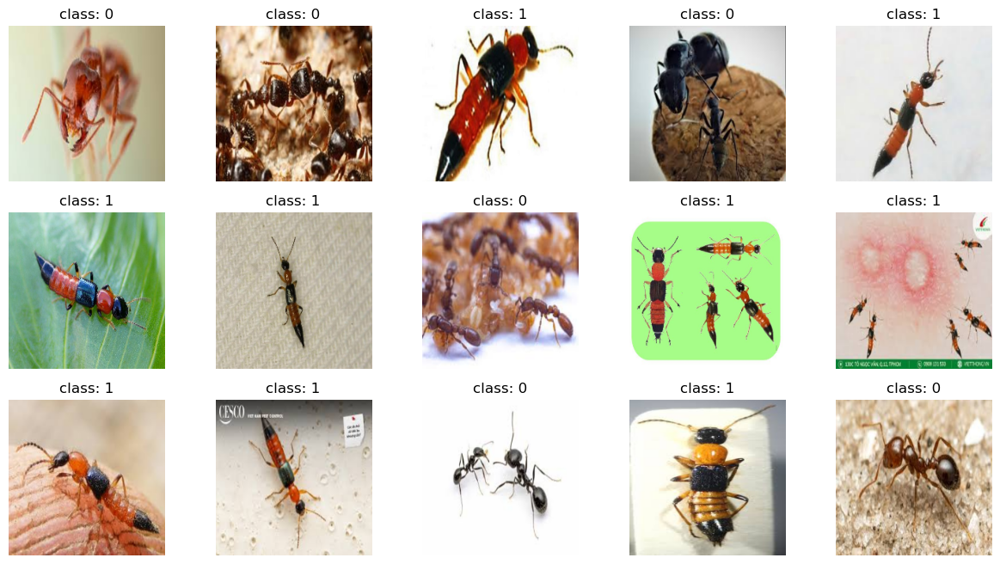

In [83]:
random_indices = random.sample(range(len(X_train)), 15)
# Hiển thị ảnh
plt.figure(figsize=(15, 8))
for i, idx in enumerate(random_indices, 1):
    plt.subplot(3, 5, i)  
    img_rgb = cv2.cvtColor(X_train[idx], cv2.COLOR_BGR2RGB)  # Chuyển BGR sang RGB
    plt.imshow(img_rgb)
    plt.title(f'class: {y_train[idx]}')
    plt.axis('off')

plt.show()

In [257]:
print(f"Tập huấn luyện có {len(X_train)} mẫu.")
print(f"Tập kiểm tra có {len(X_test)} mẫu.")

Tập huấn luyện có 151 mẫu.
Tập kiểm tra có 65 mẫu.


In [84]:
def compute_histogram_img(img_list, bins=(8, 8, 8)):
    img_features = []
    for img in img_list:
        # Convert Color to BGR
        bgr_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Calculate histogram color
        hist = cv2.calcHist([bgr_img], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
        # Normalize Histogram
        hist = cv2.normalize(hist, hist).flatten()
        img_features.append(hist)
    return np.array(img_features)


In [85]:
X_train_histogram = compute_histogram_img(X_train)
X_test_histogram = compute_histogram_img(X_test)

In [86]:
print(X_train_histogram.shape)
print(X_test_histogram.shape)

(151, 512)
(65, 512)


In [87]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_histogram, y_train)
X_test_balanced, y_test_balanced = smote.fit_resample(X_test_histogram, y_test)

In [260]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from joblib import dump
from joblib import load

In [93]:
svm_classifier_not_balanced = SVC(C=0.1, kernel='linear')
svm_classifier_not_balanced.fit(X_train_histogram, y_train)

SVC(C=0.1, kernel='linear')

In [89]:
svm_classifier_balanced = SVC(C=0.1, kernel='linear')
svm_classifier_balanced.fit(X_train_balanced, y_train_balanced)

SVC(C=0.1, kernel='linear')

In [94]:
y_pred_not_balanced = svm_classifier_not_balanced.predict(X_test_histogram)
y_pred_balanced = svm_classifier_balanced.predict(X_test_balanced)

In [95]:
print("Classification Report:")
print(classification_report(y_test, y_pred_not_balanced))

Classification Report:
              precision    recall  f1-score   support

           0       0.69      1.00      0.82        45
           1       0.00      0.00      0.00        20

    accuracy                           0.69        65
   macro avg       0.35      0.50      0.41        65
weighted avg       0.48      0.69      0.57        65



d:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [96]:
print("Classification Report:")
print(classification_report(y_test_balanced, y_pred_balanced))

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.69      0.73        45
           1       0.72      0.80      0.76        45

    accuracy                           0.74        90
   macro avg       0.75      0.74      0.74        90
weighted avg       0.75      0.74      0.74        90



In [99]:
accuracy = accuracy_score(y_test, y_pred_not_balanced)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.69


In [100]:
accuracy = accuracy_score(y_test_balanced, y_pred_balanced)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.74


In [101]:
dump(svm_classifier_balanced, "svm_model_balanced.joblib")

['svm_model_balanced.joblib']

In [102]:
dump(svm_classifier_not_balanced, "svm_model_not_balanced.joblib")

['svm_model_not_balanced.joblib']

In [103]:
loaded_model_balanced = load("svm_model_balanced.joblib")
loaded_model_not_balanced = load("svm_model_not_balanced.joblib")

In [104]:
def show_image_with_prediction_balanced(image_path, model, bins=(8, 8, 8)):
    """
    Hiển thị ảnh cùng với kết quả dự đoán.

    Parameters:
    - image_path: Đường dẫn đến ảnh cần dự đoán.
    - model: Mô hình SVM đã huấn luyện (được tải từ joblib).
    - bins: Số lượng bin để tính histogram (mặc định là (8, 8, 8)).
    """
    # Bước 1: Đọc ảnh và resize
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Không thể đọc ảnh từ đường dẫn đã cung cấp.")
    resized_img = cv2.resize(img, (224, 224))

    image_feature=compute_histogram_img([resized_img])

    # Bước 3: Dự đoán với mô hình
    prediction = model.predict(image_feature.reshape(1,-1))
    label = "Paederus" if prediction[0] == 1 else "Other Ant"

    # Bước 4: Hiển thị ảnh và kết quả dự đoán
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Chuyển ảnh từ BGR sang RGB để hiển thị
    plt.title(f"Prediction: {label}", fontsize=16)
    plt.axis("off")
    plt.show()





In [105]:
def show_image_with_prediction_not_balanced(image_path, model, bins=(8, 8, 8)):
    """
    Hiển thị ảnh cùng với kết quả dự đoán.

    Parameters:
    - image_path: Đường dẫn đến ảnh cần dự đoán.
    - model: Mô hình SVM đã huấn luyện (được tải từ joblib).
    - bins: Số lượng bin để tính histogram (mặc định là (8, 8, 8)).
    """
    # Bước 1: Đọc ảnh và resize
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Không thể đọc ảnh từ đường dẫn đã cung cấp.")
    resized_img = cv2.resize(img, (224, 224))

    image_feature=compute_histogram_img([resized_img])

    # Bước 3: Dự đoán với mô hình
    prediction = model.predict(image_feature.reshape(1,-1))
    label = "Paederus" if prediction[0] == 1 else "Other Ant"

    # Bước 4: Hiển thị ảnh và kết quả dự đoán
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Chuyển ảnh từ BGR sang RGB để hiển thị
    plt.title(f"Prediction: {label}", fontsize=16)
    plt.axis("off")
    plt.show()



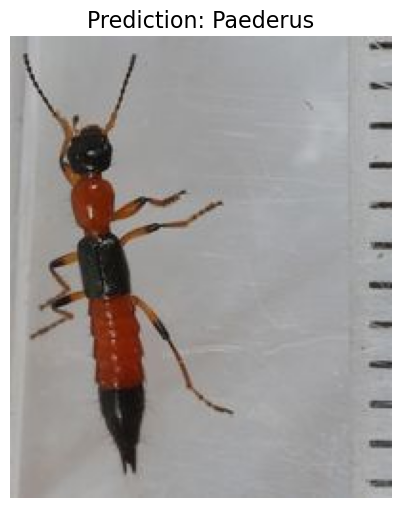

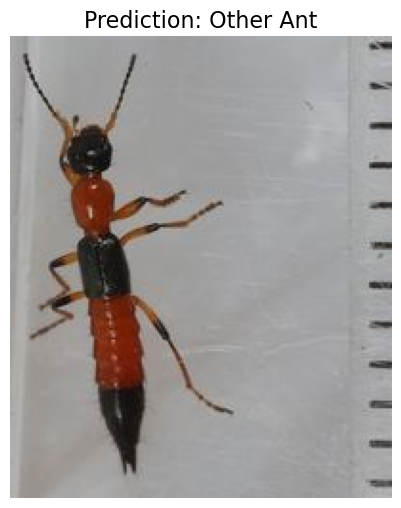

In [106]:
image_path = "paederus1.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

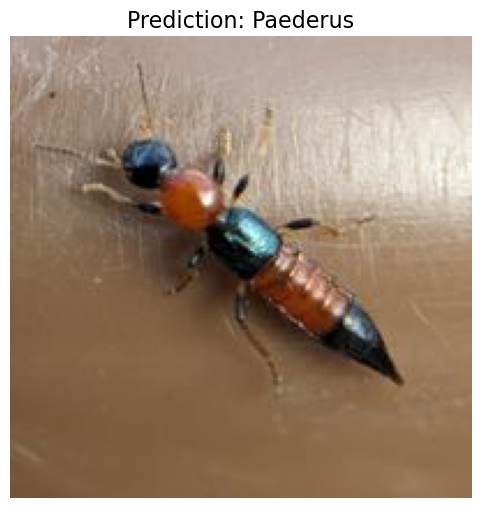

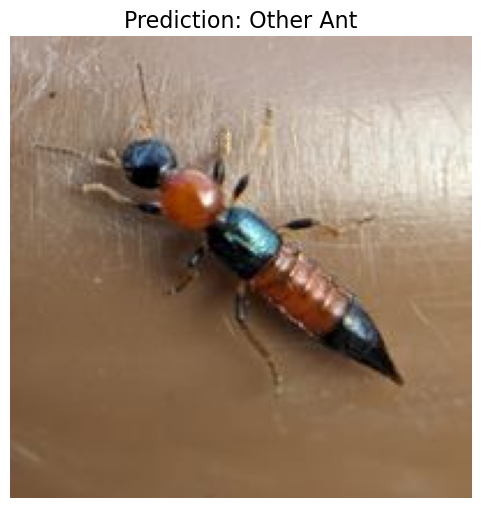

In [107]:
image_path = "paederus2.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

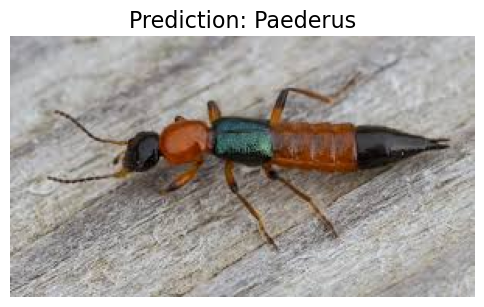

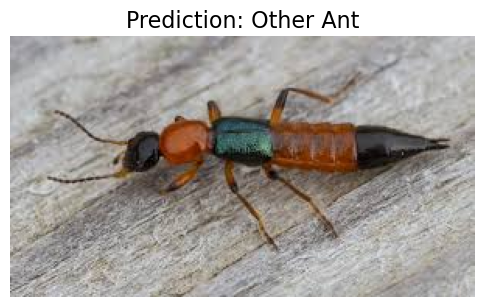

In [108]:
image_path = "paederus3.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

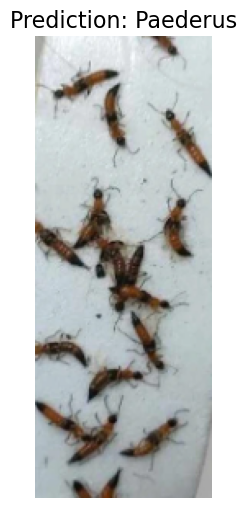

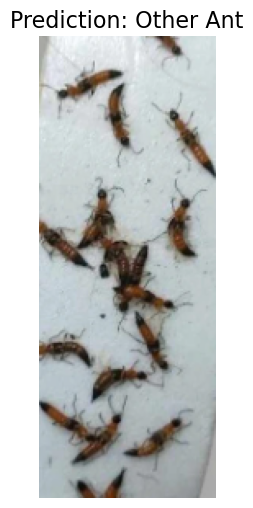

In [110]:
image_path = "paederus8.png"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

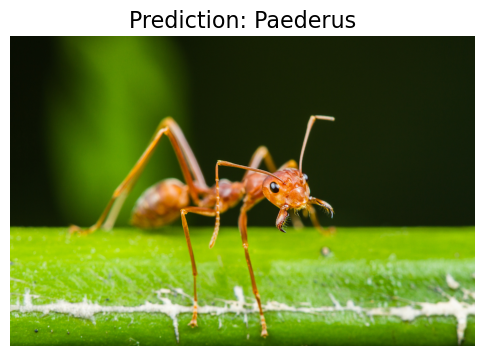

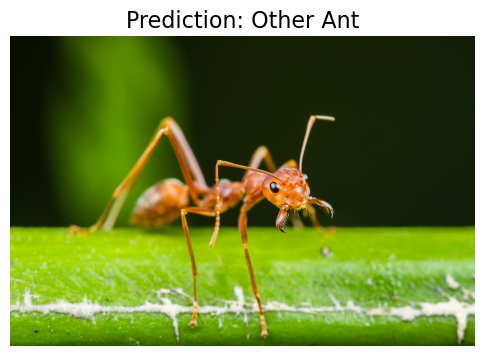

In [111]:
image_path = "other_ant5.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

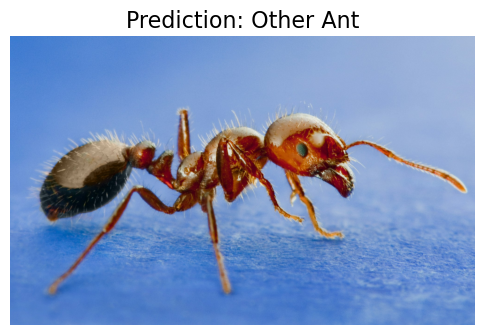

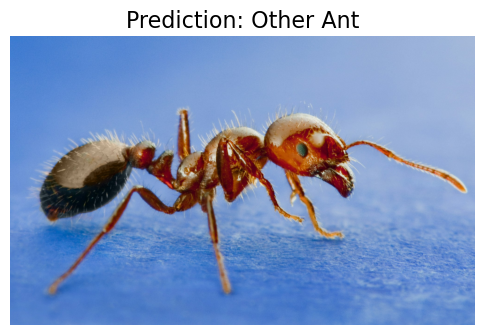

In [112]:
image_path = "other_ant1.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

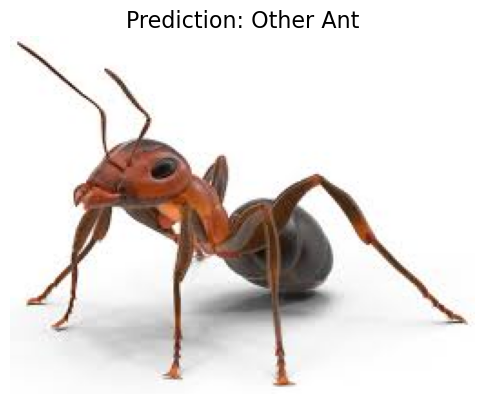

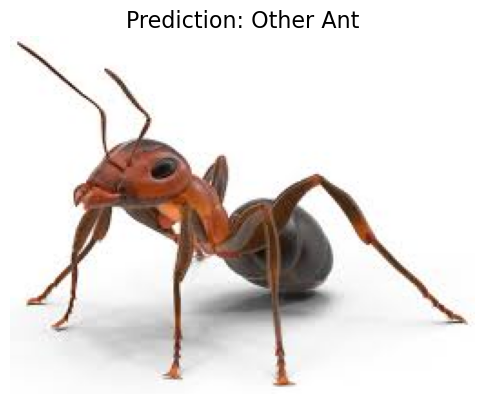

In [113]:
image_path = "other_ant2.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

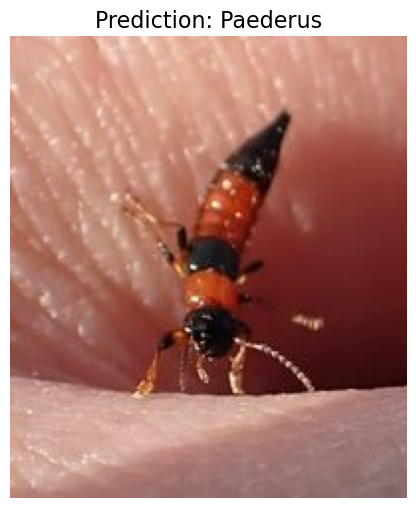

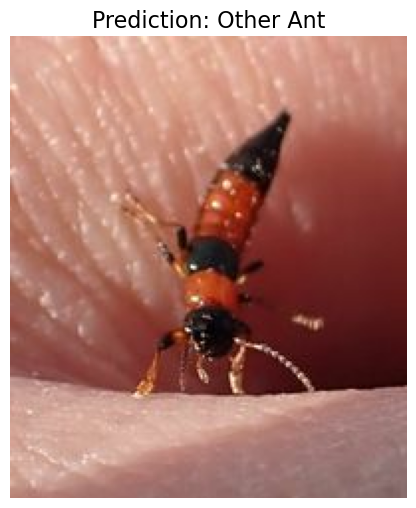

In [114]:
image_path = "paederus6.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

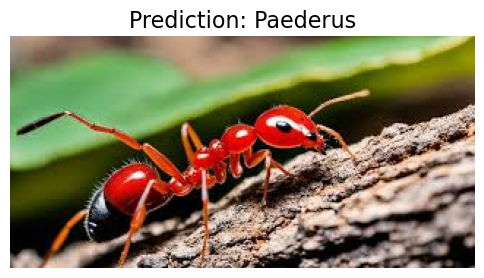

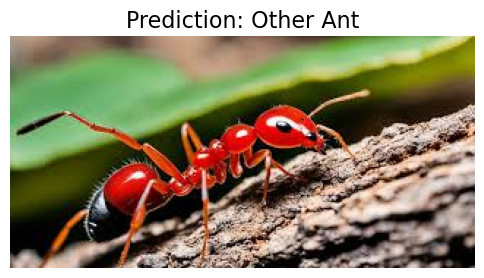

In [115]:
image_path = "other_ant6.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)

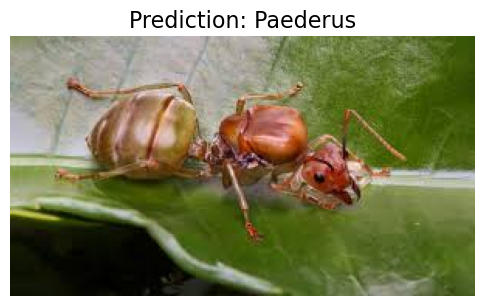

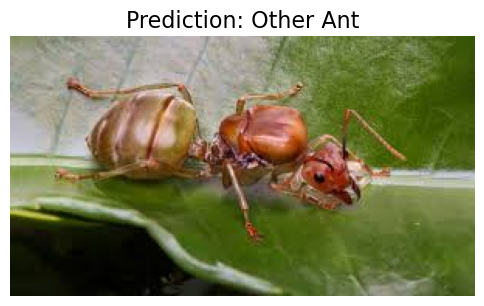

In [117]:
image_path = "other_ant7.jpg"
show_image_with_prediction_balanced(image_path, loaded_model_balanced)
show_image_with_prediction_not_balanced(image_path, loaded_model_not_balanced)